# 1. Data Preprocessing

In [438]:
#数据读取板块/准备工作
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans,AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV
from matplotlib.colors import ListedColormap
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, fowlkes_mallows_score, v_measure_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.preprocessing import PolynomialFeatures
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import locale
import os

In [402]:
df = pd.read_excel('DryBeanDataset/Dry_Bean_Dataset.xlsx')
# df.info()

In [403]:
#检查并处理缺失值,无缺失值
print(df.isnull().sum())
df = df.dropna()
print("各类别的样本数(去重前):")
for cls, count in df['Class'].value_counts().items():
    print(f"{cls}: {count} 个样本")
#删除重复值
df.drop_duplicates(inplace=True,keep='first')

print("各类别的样本数(去重后):")
for cls, count in df['Class'].value_counts().items():
    print(f"{cls}: {count} 个样本")

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64
各类别的样本数(去重前):
DERMASON: 3546 个样本
SIRA: 2636 个样本
SEKER: 2027 个样本
HOROZ: 1928 个样本
CALI: 1630 个样本
BARBUNYA: 1322 个样本
BOMBAY: 522 个样本
各类别的样本数(去重后):
DERMASON: 3546 个样本
SIRA: 2636 个样本
SEKER: 2027 个样本
HOROZ: 1860 个样本
CALI: 1630 个样本
BARBUNYA: 1322 个样本
BOMBAY: 522 个样本


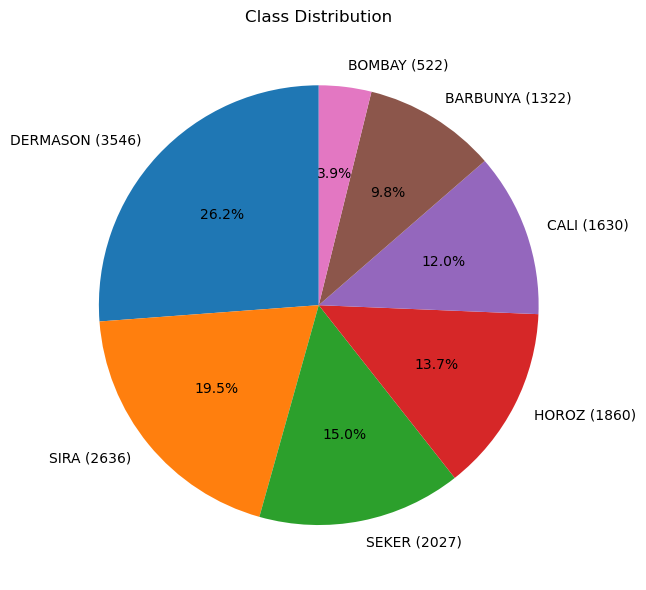

In [404]:
class_counts = df['Class'].value_counts()

labels = [f"{cls} ({count})" for cls, count in class_counts.items()]

plt.figure(figsize=(10, 6))

plt.pie(class_counts.values,labels=labels,  autopct='%1.1f%%',  startangle=90,textprops={'fontsize': 10})

plt.title('Class Distribution')
plt.tight_layout()
plt.savefig('Class Distribution Pie.png')
plt.show()

In [405]:
#feature data analysis
X = df.iloc[:, :-1]
y = df.iloc[:, -1]

feature_names = X.columns

means = df[feature_names].mean()
medians = df[feature_names].median()
stds = df[feature_names].std()
mins = df[feature_names].min()
maxs = df[feature_names].max()

summary_df = pd.DataFrame({'means': means,'medians': medians,'stds': stds,'mins': mins,'maxs': maxs})
fig, ax = plt.subplots(figsize=(10, len(summary_df)*0.5 + 1))  
ax.axis('off')  

table = ax.table(
    cellText=summary_df.round(3).values,  
    colLabels=summary_df.columns,
    rowLabels=summary_df.index,
    loc='center',
    cellLoc='center'
)
table.auto_set_font_size(False)
table.set_fontsize(10)
table.auto_set_column_width(col=list(range(len(summary_df.columns)+1)))
plt.tight_layout()
plt.savefig('feature summary.png', dpi=300, bbox_inches='tight')
plt.close()

In [406]:
# standardize features
scaler = StandardScaler()
X_std = pd.DataFrame(scaler.fit_transform(X), columns=X.columns, index=X.index)

encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)


# 2.Data Visualization

## 2.1 tSNE-2D

In [384]:
#2D-tSNE
per,lr=30,200
tsne = TSNE(perplexity=per, learning_rate=lr, random_state=0, max_iter=1000)
X_tsne = tsne.fit_transform(X_std)
unique_labels = np.unique(y_encoded)

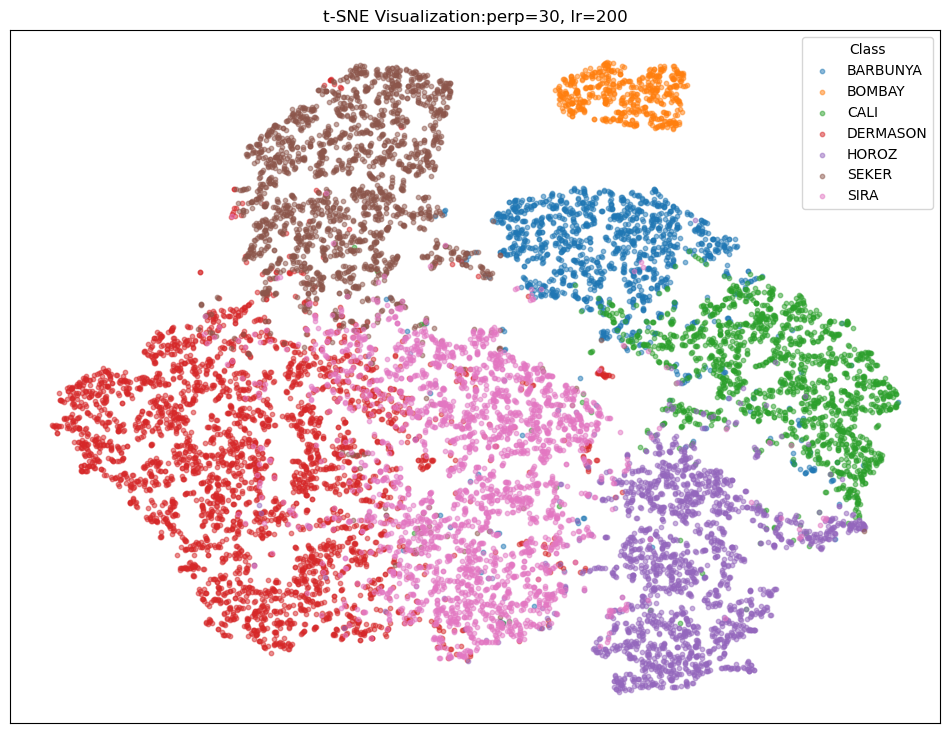

In [385]:
#Visualization 2D-tSNE
cmap = plt.get_cmap('tab10')  
colors = [cmap(i) for i in range(len(unique_labels))]

plt.figure(figsize=(12, 9))
for i, label in enumerate(unique_labels):
    plt.scatter(
        X_tsne[y_encoded == label, 0], 
        X_tsne[y_encoded == label, 1],
        s=10, 
        alpha=0.5, 
        color=colors[i],
        label=str(np.unique(y)[i]) 
    )
plt.title(f"t-SNE Visualization:perp={per}, lr={lr}")
plt.legend(title="Class")
plt.xticks([])
plt.yticks([])
plt.savefig('tsne_result.png', bbox_inches='tight')


## 2.3 tSNE-3D

In [388]:
#3D-tSNE
per,lr=30,200
tsne_3d = TSNE(n_components=3,perplexity=per, learning_rate=lr, random_state=0,max_iter=1000)
X_tsne_3d = tsne_3d.fit_transform(X_std)

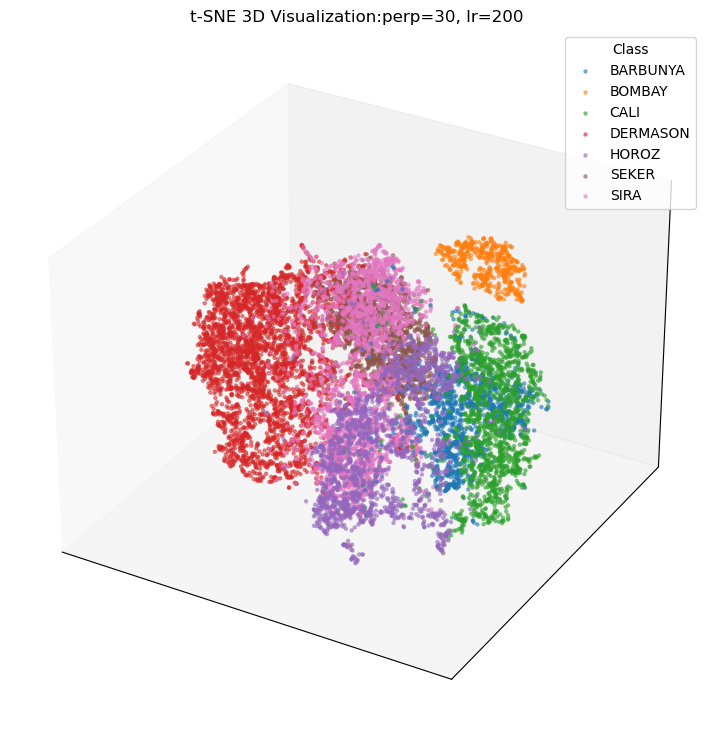

In [389]:
#Visualization 3D-tSNE
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# for i in np.unique(y_num):
for i, label in enumerate(unique_labels):
    ax.scatter(
        X_tsne_3d[y_encoded == label, 0], 
        X_tsne_3d[y_encoded == label, 1], 
        X_tsne_3d[y_encoded == label, 2],
        s=5, 
        alpha=0.5, 
        color=colors[i],
        label=str(np.unique(y)[i]) 
    )
plt.title(f"t-SNE 3D Visualization:perp={per}, lr={lr}")
plt.legend(title="Class")
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

plt.savefig('tsne_result_3D.png', bbox_inches='tight')

## 2.3 Hyperparameters Tuning(perplexities and learning_rates)

In [ ]:
# perplexities = [5, 30, 50, 100]
# learning_rates = [100, 200, 500]
# plt.figure(figsize=(16, 20))

# for i, perp in enumerate(perplexities):
#     for j, lr in enumerate(learning_rates):
#         tsne_ = TSNE(perplexity=perp, learning_rate=lr, random_state=0,max_iter=1000)
#         X_tsne_ = tsne_.fit_transform(X_std)

#         ax = plt.subplot(4, 3, i*3 + j + 1)
#         for k in range(len(unique_labels)):
#             ax.scatter(
#                 X_tsne_[y_encoded == k, 0],
#                 X_tsne_[y_encoded == k, 1],
#                 s=15,
#                 alpha=0.3,
#                 cmap='tab10',
#             )
#         ax.set_title(f"t-SNE:perp={perp}, lr={lr}")
#         ax.set_xticks([])
#         ax.set_yticks([])

# plt.tight_layout()
# plt.savefig('tsne_result1.png', bbox_inches='tight')

# 3.Clustering Analysis

## 3.1.1 Kmeans

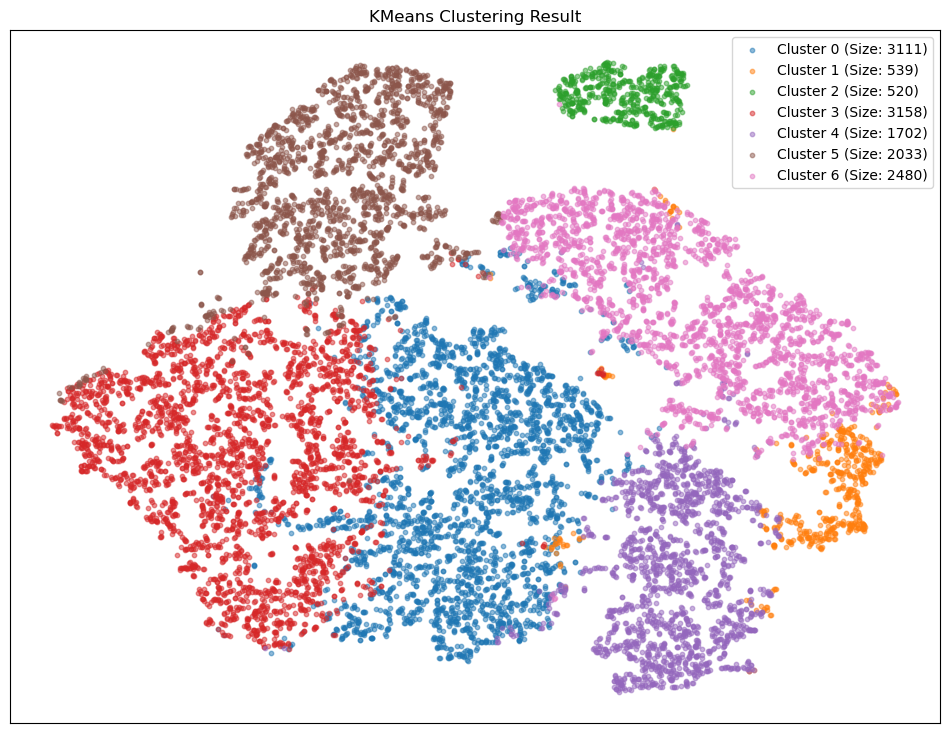

In [390]:
n_clusters_kmeans = 7
kmeans = KMeans(n_clusters=n_clusters_kmeans, random_state=0)
cluster_labels_kmeans = kmeans.fit_predict(X_std)

plt.figure(figsize=(12, 9))
for i in range(n_clusters_kmeans):
    mask = (cluster_labels_kmeans == i)
    plt.scatter(
        X_tsne[mask, 0], X_tsne[mask, 1],
        s=10, alpha=0.5,
        label=f'Cluster {i} (Size: {np.sum(mask)})'
    )    
plt.title("KMeans Clustering Result")
plt.legend()
plt.xticks([])
plt.yticks([])
plt.savefig('kmeans_tsne_result.png', bbox_inches='tight')
plt.show()



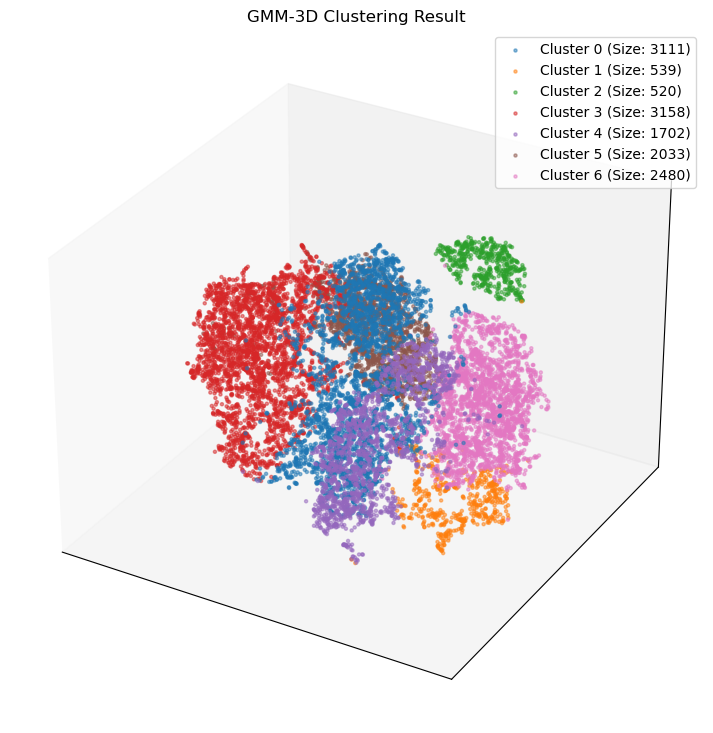

In [391]:
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

for i in range(n_clusters_kmeans):
    mask = (cluster_labels_kmeans == i)
    ax.scatter(
        X_tsne_3d[mask, 0], X_tsne_3d[mask, 1],X_tsne_3d[mask, 2],
        s=5, alpha=0.5,
        label=f'Cluster {i} (Size: {np.sum(mask)})'
    )
plt.title(f"GMM-3D Clustering Result")
plt.legend()
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
plt.show()


## 3.1.2 Agglomerative Hierarchical Clustering

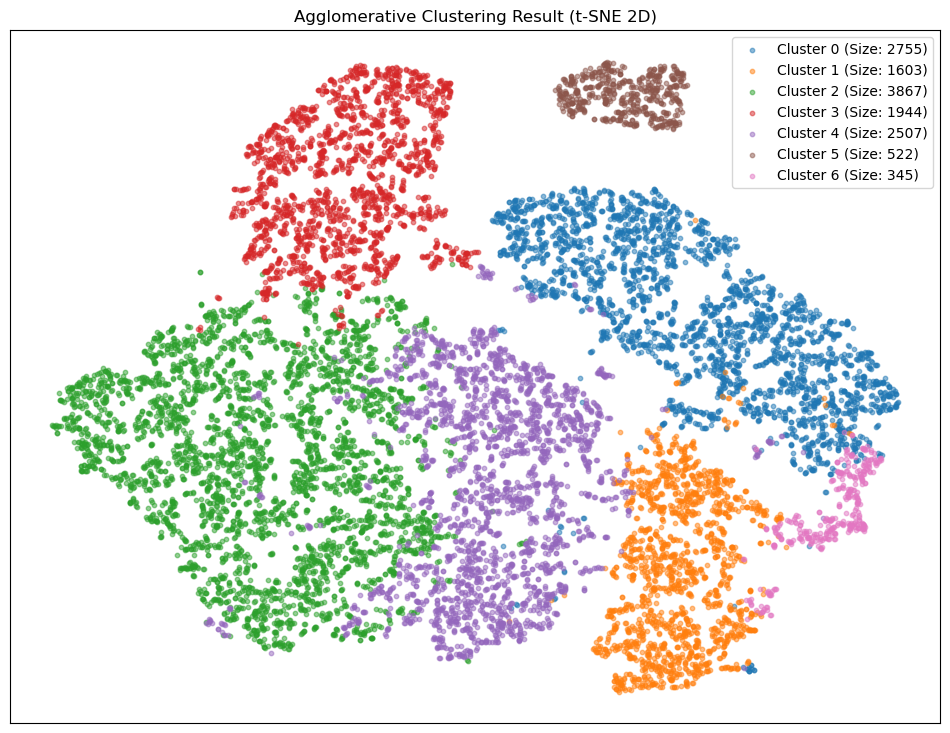

In [392]:
n_clusters_agg = len(np.unique(y))
agg = AgglomerativeClustering(n_clusters=n_clusters_agg, linkage='ward')
cluster_labels_agg = agg.fit_predict(X_std)

plt.figure(figsize=(12, 9))

for i in range(n_clusters_agg):
    mask = (cluster_labels_agg == i)
    plt.scatter(
        X_tsne[mask, 0], X_tsne[mask, 1],
        s=10, alpha=0.5,
        label=f'Cluster {i} (Size: {np.sum(mask)})'
    )
plt.title("Agglomerative Clustering Result (t-SNE 2D)")
plt.legend()
plt.xticks([])
plt.yticks([])
plt.savefig('agg_tsne_result.png', bbox_inches='tight')
plt.show()

## 3.1.3 GMM

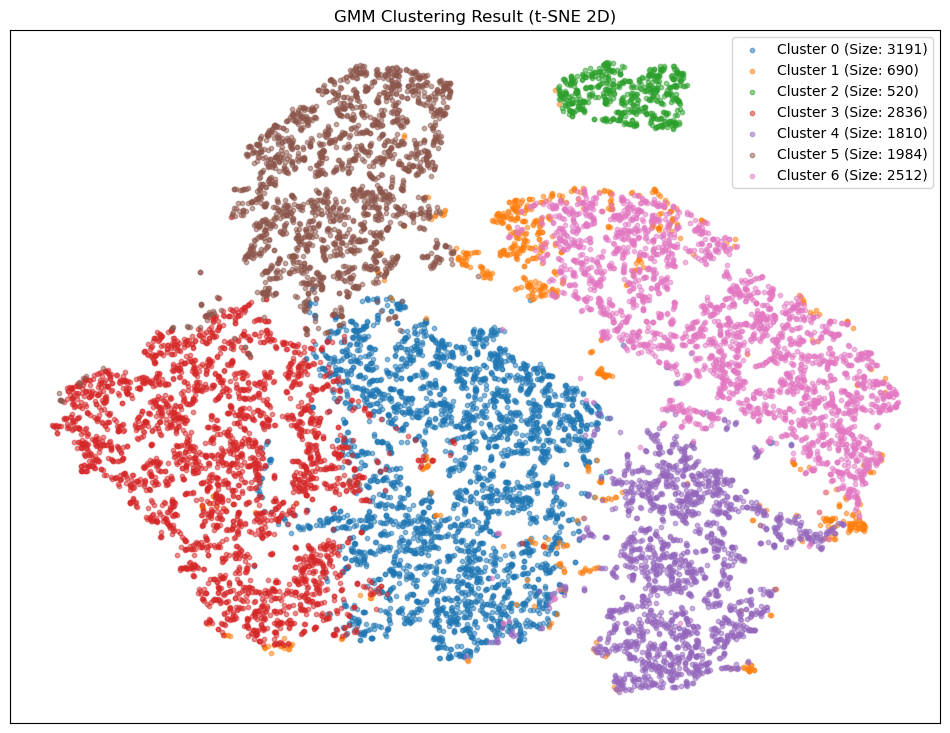

In [393]:
n_clusters_gmm = len(np.unique(y_encoded))  
gmm = GaussianMixture(n_components=n_clusters_gmm, random_state=0)
cluster_labels_gmm = gmm.fit_predict(X_std)  
cluster_probs = gmm.predict_proba(X_std)  

plt.figure(figsize=(12, 9))
for i in range(n_clusters_gmm):
    mask = (cluster_labels_gmm == i)
    plt.scatter(
        X_tsne[mask, 0], X_tsne[mask, 1],
        s=10, alpha=0.5,
        label=f'Cluster {i} (Size: {np.sum(mask)})'
    )
plt.title(f"GMM Clustering Result (t-SNE 2D)")
plt.legend()
plt.xticks([])
plt.yticks([])
plt.savefig('gmm_tsne_result.png', bbox_inches='tight', dpi=300)
plt.show()

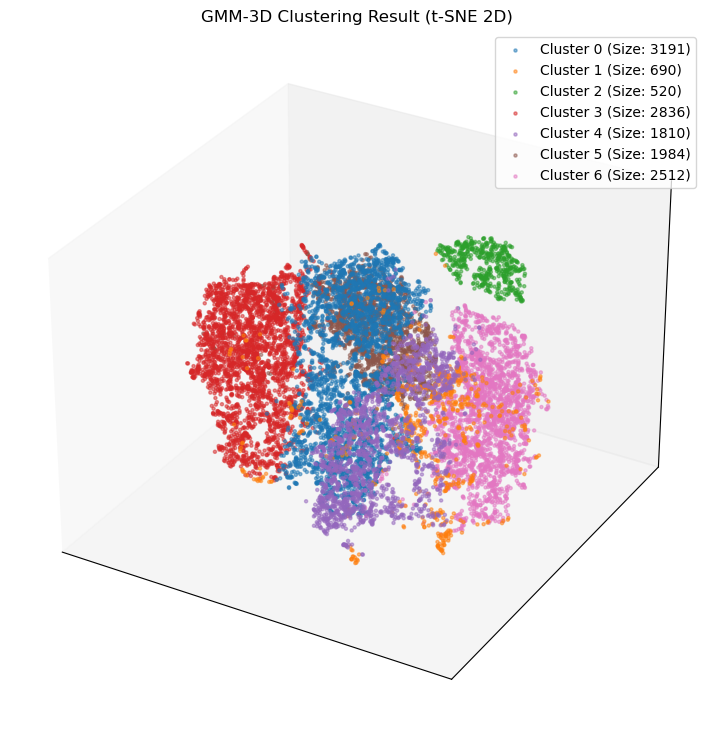

In [394]:
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

for i in range(n_clusters_gmm):
    mask = (cluster_labels_gmm == i)
    ax.scatter(
        X_tsne_3d[mask, 0], X_tsne_3d[mask, 1],X_tsne_3d[mask, 2],
        s=5, alpha=0.5,
        label=f'Cluster {i} (Size: {np.sum(mask)})'
    )
plt.title(f"GMM-3D Clustering Result (t-SNE 2D)")
plt.legend()
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
plt.show()

## 3.2 Evaluate results

In [395]:
#External指标
cluster_labels=[cluster_labels_kmeans,cluster_labels_agg,cluster_labels_gmm]
model_name=['kmeans','agg','gmm']
for i,c in enumerate(cluster_labels):
    ari = adjusted_rand_score(y, c)
    nmi = normalized_mutual_info_score(y, c)
    fmi = fowlkes_mallows_score(y, c)
    vms = v_measure_score(y, c)

    print(f"{model_name[i]}: ARI: {ari:.3f}, NMI: {nmi:.3f}, FMI: {fmi:.3f}, V-measure: {vms:.3f}")

kmeans: ARI: 0.667, NMI: 0.713, FMI: 0.726, V-measure: 0.713
agg: ARI: 0.675, NMI: 0.731, FMI: 0.736, V-measure: 0.731
gmm: ARI: 0.680, NMI: 0.732, FMI: 0.736, V-measure: 0.732


In [396]:
#Internal指标
for i,c in enumerate(cluster_labels):
    silhouette = silhouette_score(X_std, c)
    calinski = calinski_harabasz_score(X_std, c)
    davies = davies_bouldin_score(X_std, c)
    print(f"{model_name[i]}: Silhouette: {silhouette:.3f}, Calinski-Harabasz: {calinski:.3f}, Davies-Bouldin: {davies:.3f}")


kmeans: Silhouette: 0.309, Calinski-Harabasz: 7787.836, Davies-Bouldin: 1.102
agg: Silhouette: 0.289, Calinski-Harabasz: 7237.008, Davies-Bouldin: 1.127
gmm: Silhouette: 0.289, Calinski-Harabasz: 6389.939, Davies-Bouldin: 1.657


# 4. Prediction: Training and Testing

In [407]:
X_train, X_test, y_train, y_test = train_test_split(X_std, y_encoded, test_size=0.3, random_state=42,stratify=y)
print(np.shape(X_train))

(9480, 16)


In [408]:
# 评估函数，可复用
def evaluate_dataset(X, y, dataset_name, model,string, encoder):
    y_pred = model.predict(X)
    accuracy = accuracy_score(y, y_pred)
    print(f"\n{string}:{dataset_name}evaluation outcome")
    print(classification_report(y, y_pred, target_names=encoder.classes_))
    return accuracy

    # 混淆矩阵，可复用
def printmatrix(X, y, dataset_name, model, encoder):
    y_pred = model.predict(X)
    cm = confusion_matrix(y, y_pred)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=encoder.classes_,
                yticklabels=encoder.classes_)
    plt.xlabel('Predicted label')
    plt.ylabel('Groundtruth label')
    plt.title(f'{dataset_name} confusion matrices')
    plt.tight_layout()
    plt.show()
    return

def plot_all_confusion_matrices(model, string,encoder, 
                                X_train, y_train, 
                                X_test, y_test, 
                                X_std, y_encoded):
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))
    datasets = [
        (X_train, y_train, "training set", axes[0]),
        (X_test, y_test, "testing set", axes[1]),
        (X_std, y_encoded, "entire set", axes[2])
    ]
    for X, y, name, ax in datasets:
        y_pred = model.predict(X)
        cm = confusion_matrix(y, y_pred)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=encoder.classes_,
                    yticklabels=encoder.classes_,
                    ax=ax)
        ax.set_xlabel('Predicted label')
        ax.set_ylabel('Groundtruth label')
        ax.set_title(f'{name} confusion matrices')
    plt.suptitle(f'{string} confusion matrices', fontsize=20, y=1.05)
    plt.tight_layout()
    plt.savefig(f'{string} confusion matrices.png')
    
def report(model,string):
    evaluate_dataset(X_train, y_train, "training set ", model,string, encoder)
    evaluate_dataset(X_test, y_test, "testing set ", model,string,encoder)
    evaluate_dataset(X_std, y_encoded, "entire set ", model,string, encoder)
    plot_all_confusion_matrices(model, string, encoder, X_train, y_train,X_test, y_test, X_std, y_encoded)

In [409]:
#  可视化决策边界（降维到二维） 可复用 X_train_2d, X_test_2d
pca = PCA(n_components=2)
X_train_2d = pca.fit_transform(X_train)
X_test_2d = pca.transform(X_test)

loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

from matplotlib.colors import ListedColormap
def vis(modeluse, string, X_train_2d, X_test_2d,y_train,y_test):
    # 创建网格
    h = 0.02  
    x_min, x_max = X_train_2d[:, 0].min() - 1, X_train_2d[:, 0].max() + 1
    y_min, y_max = X_train_2d[:, 1].min() - 1, X_train_2d[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    # 预测类别
    Z = modeluse.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # 颜色分配
    unique_labels = np.unique(np.concatenate([y_train, y_test]))
    cmap = plt.get_cmap('tab10')
    colors = [cmap(i) for i in range(len(unique_labels))]
    label_to_color = {label: colors[i] for i, label in enumerate(unique_labels)}
    label_to_name = {label: encoder.classes_[label] for label in unique_labels}
    # 用ListedColormap确保区域和点颜色一致
    region_cmap = ListedColormap(colors)

    # 决策边界
    plt.figure(figsize=(12, 9))
    plt.contourf(xx, yy, Z, alpha=0.15, cmap=region_cmap, levels=np.arange(len(unique_labels)+1)-0.5)

    # 绘制训练集
    for label in unique_labels:
        idx = (y_train == label)
        plt.scatter(
            X_train_2d[idx, 0], X_train_2d[idx, 1],
            c=[label_to_color[label]], marker='o', s=50, alpha=0.5,
            label=f"{label_to_name[label]} (train)"
        )
    # 绘制测试集
    for label in unique_labels:
        idx = (y_test == label)
        plt.scatter(
            X_test_2d[idx, 0], X_test_2d[idx, 1],
            c=[label_to_color[label]], marker='x', s=50, alpha=0.5,
            label=f"{label_to_name[label]} (test)"
        )

    # 自定义图例（只保留每个类别一个颜色，区分train/test）
    handles = []
    from matplotlib.lines import Line2D
    for label in unique_labels:
        handles.append(Line2D([0], [0], marker='o', color='w', markerfacecolor=label_to_color[label], 
                              markeredgecolor='k', markersize=8, label=f"{label_to_name[label]} (train)"))
        handles.append(Line2D([0], [0], marker='x', color=label_to_color[label], markerfacecolor='w', 
                              markeredgecolor=label_to_color[label], markersize=8, label=f"{label_to_name[label]} (test)"))
    plt.legend(handles=handles, title="Clas and data set", bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.xlabel('main component 1')
    plt.ylabel('main component 2')
    plt.title('the decision boundary of ' + string)
    plt.tight_layout()
    plt.savefig(string+'-2d decision boundary')
    return


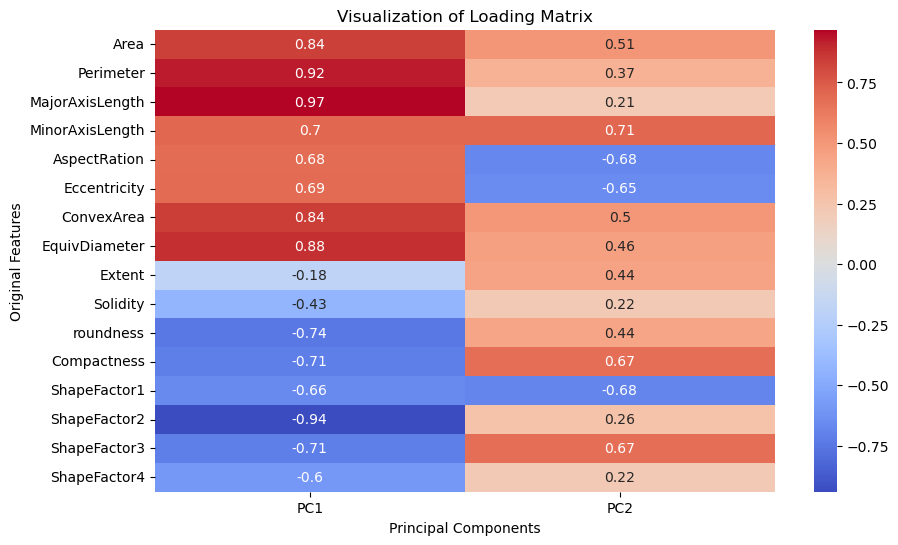

In [410]:
# 主成分的载荷矩阵（所有模型均相同）
# print("Loading matrix:")
# for i, loading in enumerate(loadings):
#     print(f"Principal component {i + 1}: {loading}")

plt.figure(figsize=(10, 6))
sns.heatmap(loadings, annot=True, cmap='coolwarm', 
            xticklabels=[f"PC{i+1}" for i in range(pca.n_components_)], 
            yticklabels= feature_names)
plt.title("Visualization of Loading Matrix")
plt.xlabel("Principal Components")
plt.ylabel("Original Features")
plt.savefig("Loading matrix.png")


## 4.1 Logistic Regression

Train Accuracy: 0.926
Test Accuracy: 0.921


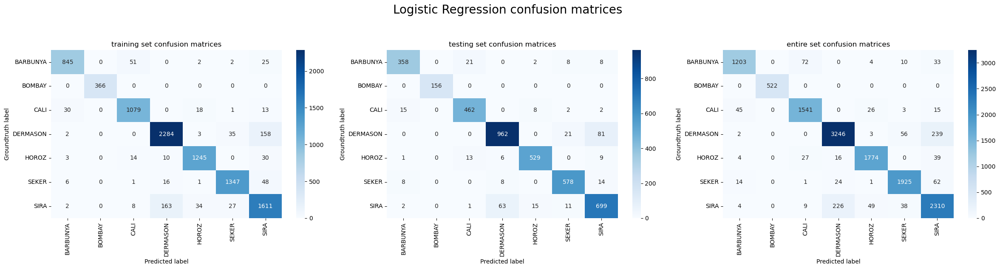

In [411]:
# Logistic Regression
LR = LogisticRegression(max_iter=1000)
LR.fit(X_train, y_train)

y_pred_train = LR.predict(X_train)
y_pred_test = LR.predict(X_test)
train_accuracy_LR = accuracy_score(y_train, y_pred_train)
test_accuracy_LR = accuracy_score(y_test, y_pred_test)
print(f"Train Accuracy: {train_accuracy_LR:.3f}")
print(f"Test Accuracy: {test_accuracy_LR:.3f}")

plot_all_confusion_matrices(LR, 'Logistic Regression', encoder, X_train, y_train,X_test, y_test, X_std, y_encoded)

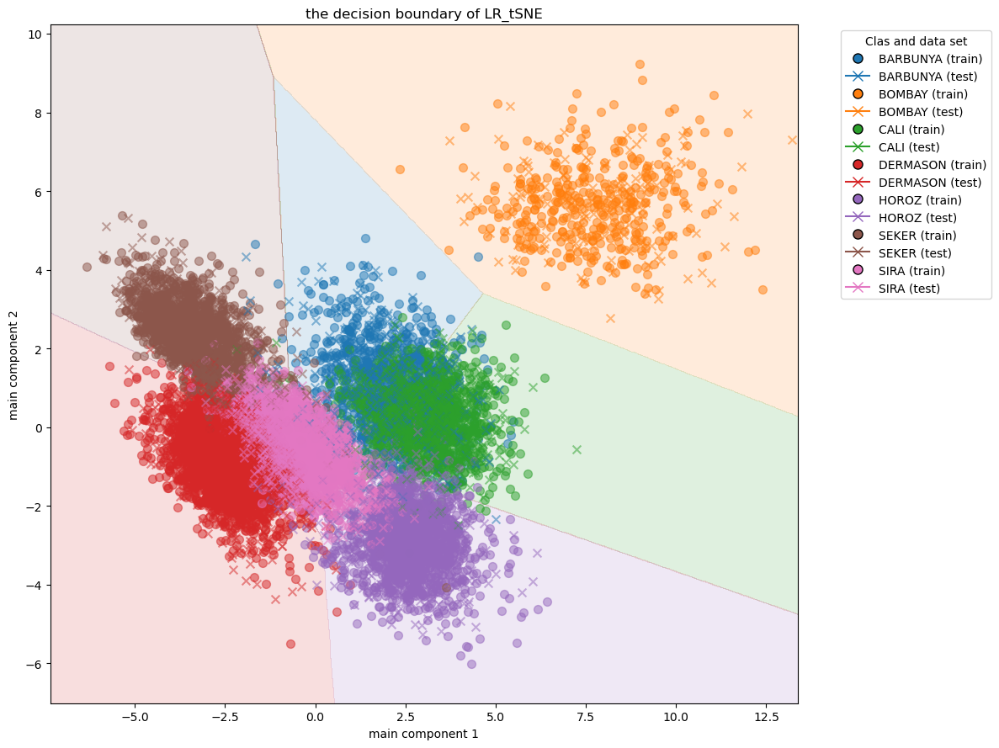

In [412]:
LR_2d = LogisticRegression(max_iter=1000)
LR_2d.fit(X_train_2d, y_train)

vis(LR_2d, "LR_tSNE", X_train_2d, X_test_2d, y_train, y_test)

## 4.2 SVM

Train Accuracy: 0.935
Test Accuracy: 0.925


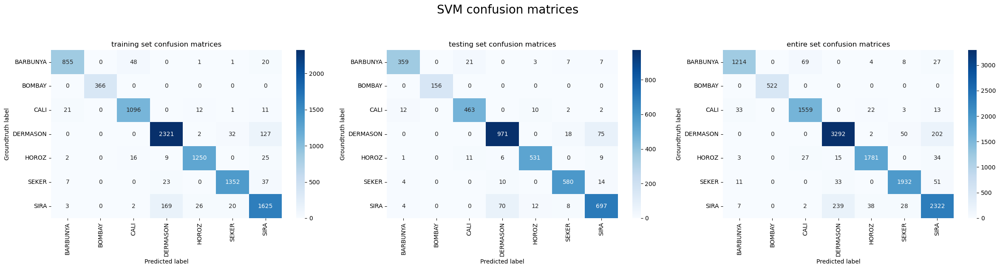

In [413]:
#svm
from sklearn.svm import SVC
SVM = SVC(probability=True,random_state=42)
SVM.fit(X_train, y_train)

y_pred_train = SVM.predict(X_train)
y_pred_test = SVM.predict(X_test)
train_accuracy_SVM = accuracy_score(y_train, y_pred_train)
test_accuracy_SVM = accuracy_score(y_test, y_pred_test)
print(f"Train Accuracy: {train_accuracy_SVM:.3f}")
print(f"Test Accuracy: {test_accuracy_SVM:.3f}")

plot_all_confusion_matrices(SVM, 'SVM', encoder, X_train, y_train,X_test, y_test, X_std, y_encoded)

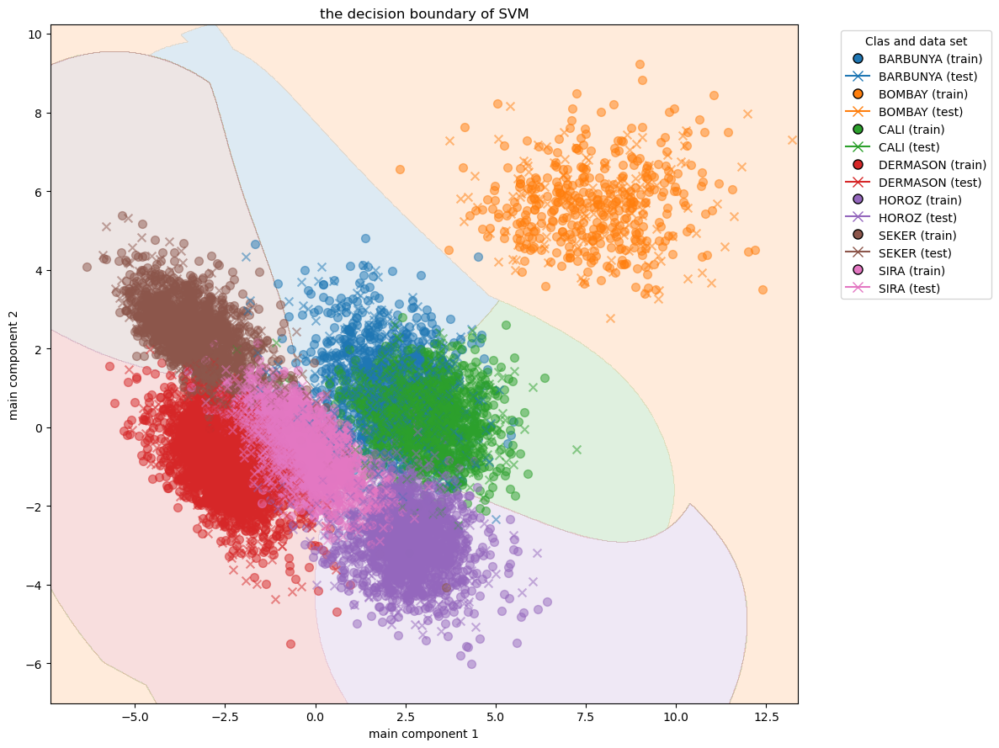

In [414]:
#svm 的 vis
SVM_2d = SVC()
SVM_2d.fit(X_train_2d, y_train)

# vis(SVM_2d,"SVM")
vis(SVM_2d,"SVM",X_train_2d,X_test_2d,y_train,y_test)

## 4.3 KNN


KNN:training set evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.97      0.93      0.95       925
      BOMBAY       1.00      1.00      1.00       366
        CALI       0.94      0.97      0.95      1141
    DERMASON       0.93      0.95      0.94      2482
       HOROZ       0.97      0.96      0.97      1302
       SEKER       0.96      0.96      0.96      1419
        SIRA       0.91      0.90      0.90      1845

    accuracy                           0.94      9480
   macro avg       0.96      0.95      0.95      9480
weighted avg       0.95      0.94      0.94      9480


KNN:testing set evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.89      0.91       397
      BOMBAY       1.00      1.00      1.00       156
        CALI       0.92      0.95      0.93       489
    DERMASON       0.91      0.91      0.91      1064
       HOROZ       0.96      0.94      0.95       558
     

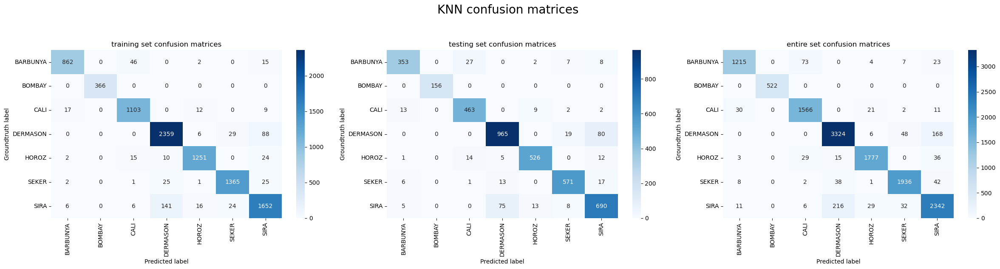

In [415]:
#KNN
KNN = KNeighborsClassifier()
KNN.fit(X_train, y_train)

report(KNN,"KNN")

## 4.3 Decision Tree

Train Accuracy: 0.967
Test Accuracy: 0.899


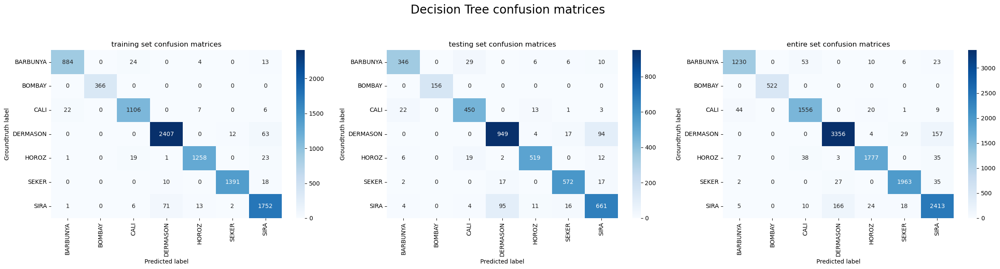

In [416]:
#Decision Tree
dt = DecisionTreeClassifier(max_depth=10, random_state=42)
dt.fit(X_train, y_train)

y_pred_train = dt.predict(X_train)
y_pred_test = dt.predict(X_test)
train_accuracy_dt = accuracy_score(y_train, y_pred_train)
print(f"Train Accuracy: {train_accuracy_dt:.3f}")
test_accuracy_dt = accuracy_score(y_test, y_pred_test)
print(f"Test Accuracy: {test_accuracy_dt:.3f}")

plot_all_confusion_matrices(dt, 'Decision Tree', encoder, X_train, y_train,X_test, y_test, X_std, y_encoded)

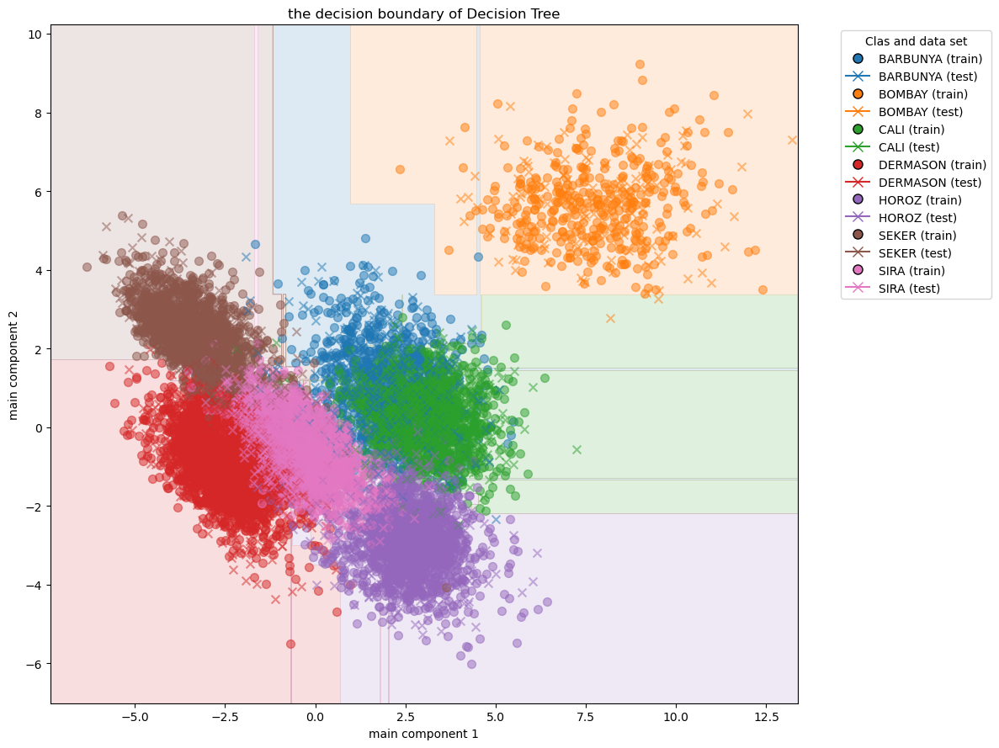

In [417]:
dt_2d = DecisionTreeClassifier(max_depth=10, random_state=42)
dt_2d.fit(X_train_2d, y_train)

vis(dt_2d,"Decision Tree",X_train_2d,X_test_2d,y_train,y_test)

## 4.4 XGBoosting

Train Accuracy: 0.998
Test Accuracy: 0.923


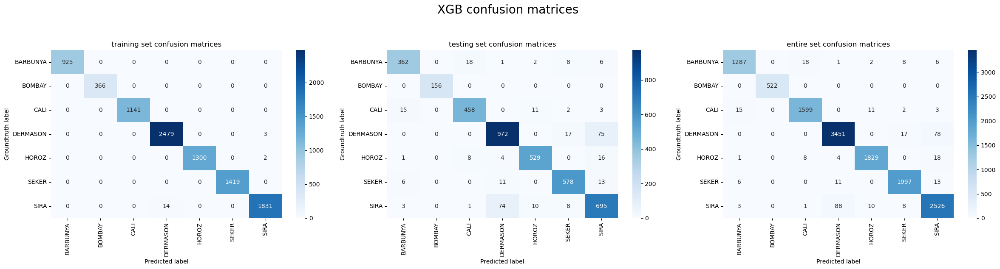

In [418]:
XGB = xgb.XGBClassifier(n_estimators=200, learning_rate=0.1)
XGB.fit(X_train,y_train)

y_pred_train = XGB.predict(X_train)
y_pred_test = XGB.predict(X_test)
train_accuracy_XGB = accuracy_score(y_train, y_pred_train)
print(f"Train Accuracy: {train_accuracy_XGB:.3f}")
test_accuracy_XGB = accuracy_score(y_test, y_pred_test)
print(f"Test Accuracy: {test_accuracy_XGB:.3f}")

plot_all_confusion_matrices(XGB, 'XGB', encoder, X_train, y_train,X_test, y_test, X_std, y_encoded)

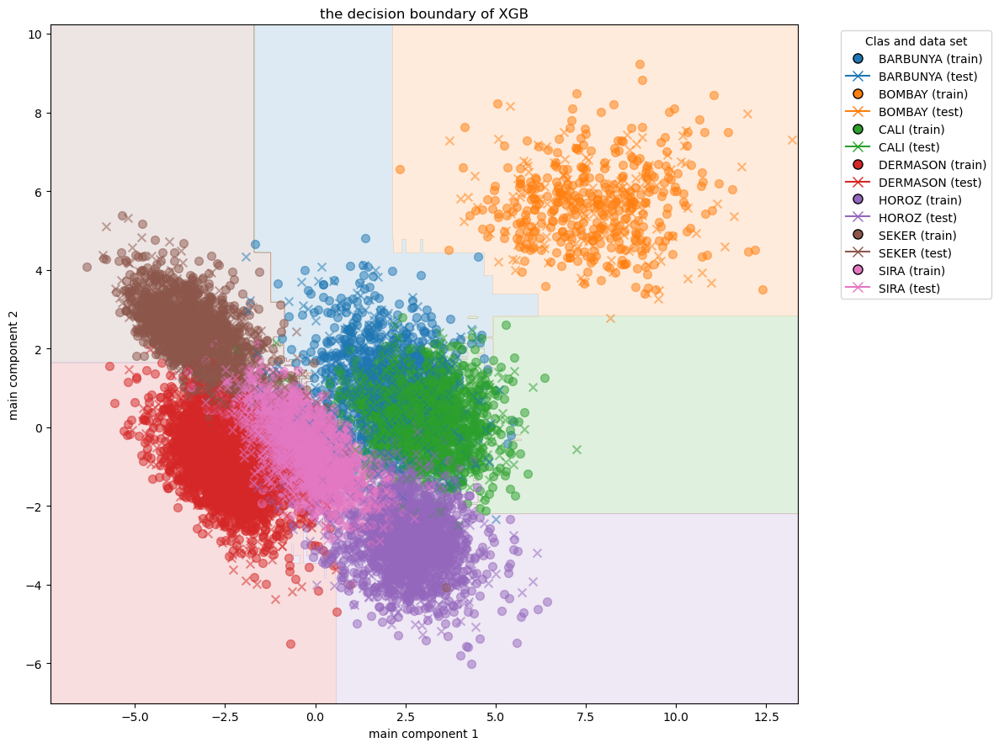

In [419]:
#XGB 的vis

XGB_2d = xgb.XGBClassifier()
XGB_2d.fit(X_train_2d, y_train)

# vis(XGB_2d,"XGB")
vis(XGB_2d,"XGB",X_train_2d,X_test_2d,y_train,y_test)

# 5. Evaluation and Choice of Prediction Model

## 5.1 Training Set Evaluation Outcome


In [420]:
evaluate_dataset(X_train, y_train, "training set ", LR, "Logistic Regression",encoder)
evaluate_dataset(X_train, y_train, "training set ", SVM, "SVM",encoder)
evaluate_dataset(X_train, y_train, "training set ", dt, "Decision Tree",encoder)
evaluate_dataset(X_train, y_train, "training set ", XGB, "XGBoosting",encoder)



Logistic Regression:training set evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.91      0.93       925
      BOMBAY       1.00      1.00      1.00       366
        CALI       0.94      0.95      0.94      1141
    DERMASON       0.92      0.92      0.92      2482
       HOROZ       0.96      0.96      0.96      1302
       SEKER       0.95      0.95      0.95      1419
        SIRA       0.85      0.87      0.86      1845

    accuracy                           0.93      9480
   macro avg       0.94      0.94      0.94      9480
weighted avg       0.93      0.93      0.93      9480


SVM:training set evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.96      0.92      0.94       925
      BOMBAY       1.00      1.00      1.00       366
        CALI       0.94      0.96      0.95      1141
    DERMASON       0.92      0.94      0.93      2482
       HOROZ       0.97      0.96      0.9

0.9979957805907173

## 5.1 Testing Set Evaluation Outcome


In [421]:
evaluate_dataset(X_test, y_test, "testing set ", LR, "Logistic Regression",encoder)
evaluate_dataset(X_test, y_test, "testing set ", SVM, "SVM",encoder)
evaluate_dataset(X_test, y_test, "testing set ", dt, "Decision Tree",encoder)
evaluate_dataset(X_test, y_test, "testing set ", XGB, "XGBoosting",encoder)


Logistic Regression:testing set evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.90      0.92       397
      BOMBAY       1.00      1.00      1.00       156
        CALI       0.93      0.94      0.94       489
    DERMASON       0.93      0.90      0.91      1064
       HOROZ       0.95      0.95      0.95       558
       SEKER       0.93      0.95      0.94       608
        SIRA       0.86      0.88      0.87       791

    accuracy                           0.92      4063
   macro avg       0.93      0.93      0.93      4063
weighted avg       0.92      0.92      0.92      4063


SVM:testing set evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.94      0.90      0.92       397
      BOMBAY       1.00      1.00      1.00       156
        CALI       0.94      0.95      0.94       489
    DERMASON       0.92      0.91      0.92      1064
       HOROZ       0.96      0.95      0.95 

0.9229633275904504

In [422]:

def grid(model,param_grid,string):
  # 使用网格搜索进行超参数调优
  grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')
  grid_search.fit(X_train, y_train)

  # 输出最优超参数组合和对应的得分
  print("the model optimizing is ", model)
  print("最优超参数组合: ", grid_search.best_params_)
  print("最优得分: ", grid_search.best_score_)

  # 使用最优模型进行预测
  best_model = grid_search.best_estimator_
  #y_pred_best = best_model.predict(X_test)

  # 评估最优模型
  evaluate_dataset(X_train, y_train, "training set (Best Model)", best_model,string,encoder)
  evaluate_dataset(X_test, y_test, "testing set (Best Model)", best_model,string, encoder)

In [296]:
# LR的grid
LR_param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear','saga']
}

LRG = LogisticRegression(max_iter=1000)
grid(LRG, LR_param_grid,"Logistic Regression")

the model optimizing is  LogisticRegression(max_iter=1000)
最优超参数组合:  {'C': 1, 'penalty': 'l2', 'solver': 'saga'}
最优得分:  0.9248945147679326

Logistic Regression:training set (Best Model)evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.91      0.93       925
      BOMBAY       1.00      1.00      1.00       366
        CALI       0.94      0.95      0.94      1141
    DERMASON       0.92      0.92      0.92      2482
       HOROZ       0.96      0.96      0.96      1302
       SEKER       0.95      0.95      0.95      1419
        SIRA       0.85      0.87      0.86      1845

    accuracy                           0.93      9480
   macro avg       0.94      0.94      0.94      9480
weighted avg       0.93      0.93      0.93      9480


Logistic Regression:testing set (Best Model)evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.90      0.92       397
      BOMBAY       1.00   

In [297]:
#svm 的 grid
SVM_param_grid = {
    'C': [0.1, 1, 10, 100],  # 正则化参数
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],  # 核函数
    'gamma': ['scale', 'auto', 0.001, 0.01, 0.1]  # 核系数参数
}

SVMG = SVC()

grid(SVMG,SVM_param_grid,"SVM")

the model optimizing is  SVC()
最优超参数组合:  {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
最优得分:  0.9330168776371309

SVM:training set (Best Model)evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.97      0.95      0.96       925
      BOMBAY       1.00      1.00      1.00       366
        CALI       0.96      0.97      0.96      1141
    DERMASON       0.92      0.95      0.93      2482
       HOROZ       0.98      0.96      0.97      1302
       SEKER       0.97      0.96      0.97      1419
        SIRA       0.90      0.88      0.89      1845

    accuracy                           0.94      9480
   macro avg       0.96      0.95      0.96      9480
weighted avg       0.94      0.94      0.94      9480


SVM:testing set (Best Model)evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.91      0.92       397
      BOMBAY       1.00      1.00      1.00       156
        CALI       0.94      0.94  

In [423]:
#KNN的grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],  # K值
    'weights': ['uniform', 'distance'],  # 权重计算方式
    'metric': ['euclidean', 'manhattan', 'minkowski']  # 距离度量
}

KNNG = KNeighborsClassifier()

grid(KNNG,param_grid,"KNN")

the model optimizing is  KNeighborsClassifier()
最优超参数组合:  {'metric': 'euclidean', 'n_neighbors': 7, 'weights': 'distance'}
最优得分:  0.9251054852320675

KNN:training set (Best Model)evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       1.00      1.00      1.00       925
      BOMBAY       1.00      1.00      1.00       366
        CALI       1.00      1.00      1.00      1141
    DERMASON       1.00      1.00      1.00      2482
       HOROZ       1.00      1.00      1.00      1302
       SEKER       1.00      1.00      1.00      1419
        SIRA       1.00      1.00      1.00      1845

    accuracy                           1.00      9480
   macro avg       1.00      1.00      1.00      9480
weighted avg       1.00      1.00      1.00      9480


KNN:testing set (Best Model)evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.94      0.89      0.92       397
      BOMBAY       1.00      1.00      1.00     

In [299]:
#Decision tree的grid
import warnings
warnings.filterwarnings("ignore", message="invalid value encountered in cast")
dt_param_grid = {
    'criterion':['gini','entropy'],
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10,20],
    'min_samples_leaf': [1, 3, 5,10],
    'max_features': ['log2', 'sqrt', 0.5],
}
dtG = DecisionTreeClassifier()
grid(dtG,dt_param_grid,"Decision Tree")

the model optimizing is  DecisionTreeClassifier()
最优超参数组合:  {'criterion': 'entropy', 'max_depth': 10, 'max_features': 0.5, 'min_samples_leaf': 5, 'min_samples_split': 20}
最优得分:  0.9127637130801688

Decision Tree:training set (Best Model)evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.95      0.94       925
      BOMBAY       1.00      1.00      1.00       366
        CALI       0.95      0.96      0.96      1141
    DERMASON       0.95      0.94      0.94      2482
       HOROZ       0.97      0.96      0.96      1302
       SEKER       0.96      0.96      0.96      1419
        SIRA       0.90      0.92      0.91      1845

    accuracy                           0.94      9480
   macro avg       0.95      0.95      0.95      9480
weighted avg       0.95      0.94      0.94      9480


Decision Tree:testing set (Best Model)evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.88      0.89 

In [ ]:
#XGB的grid
param_grid = {
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'gamma': [0, 0.1, 0.2]
}

XGBG = xgb.XGBClassifier()

grid(XGBG, param_grid,"XGB")


the model optimizing is  XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)
最优超参数组合:  {'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}
最优得分:  0.930379746835443

XGB:training set (Best Model)evaluation outcome
              precision    recall  f1-score   support

    

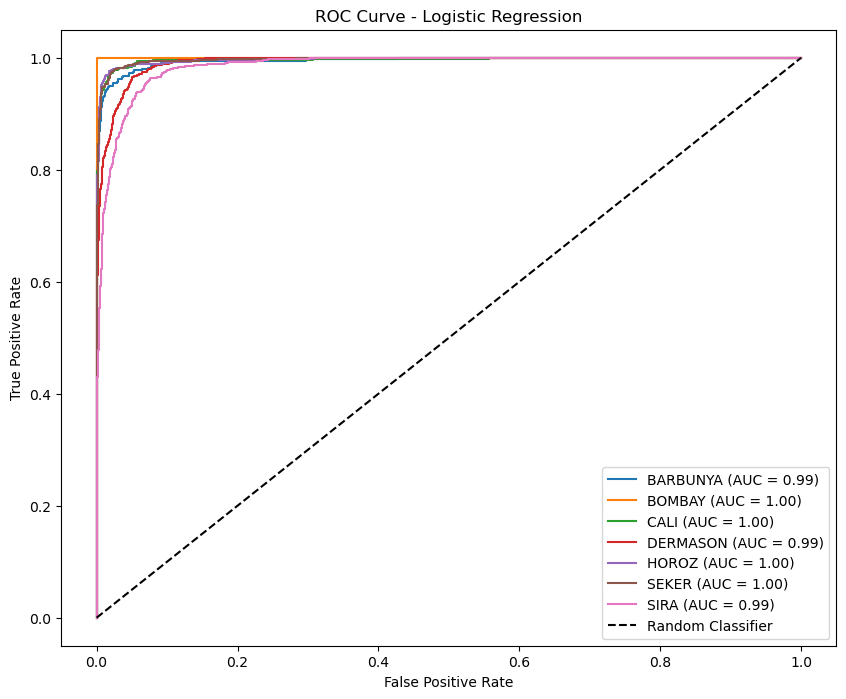

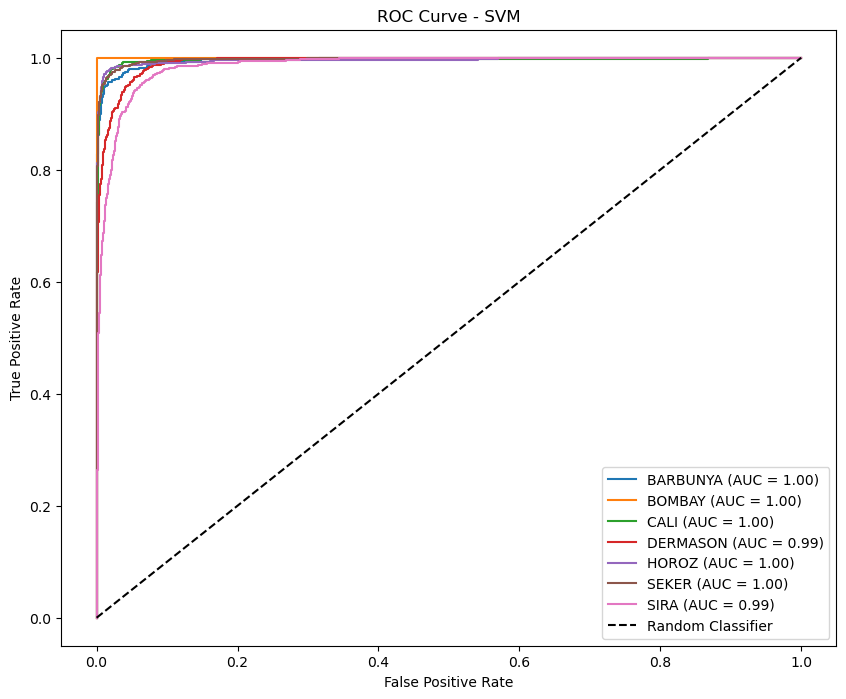

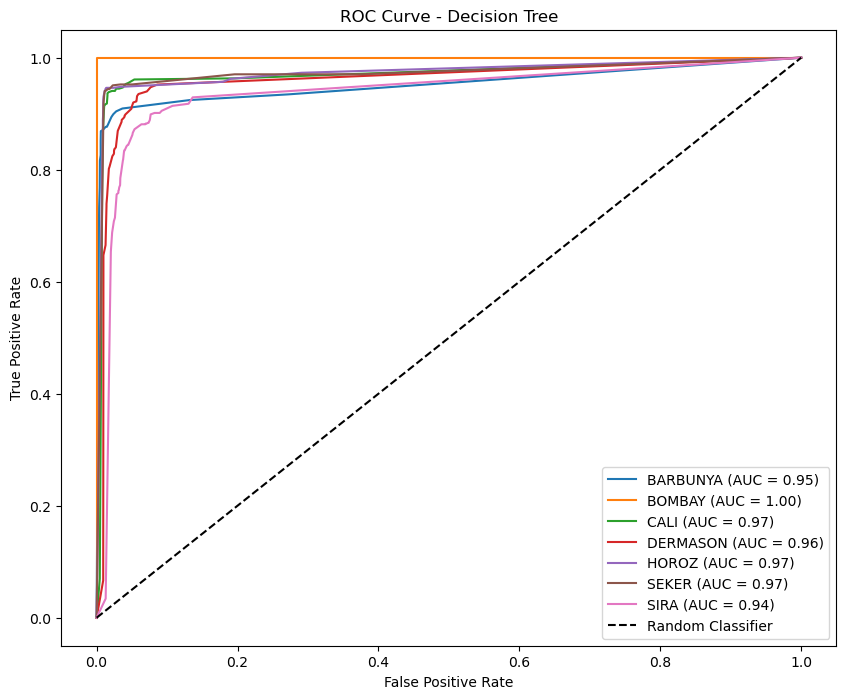

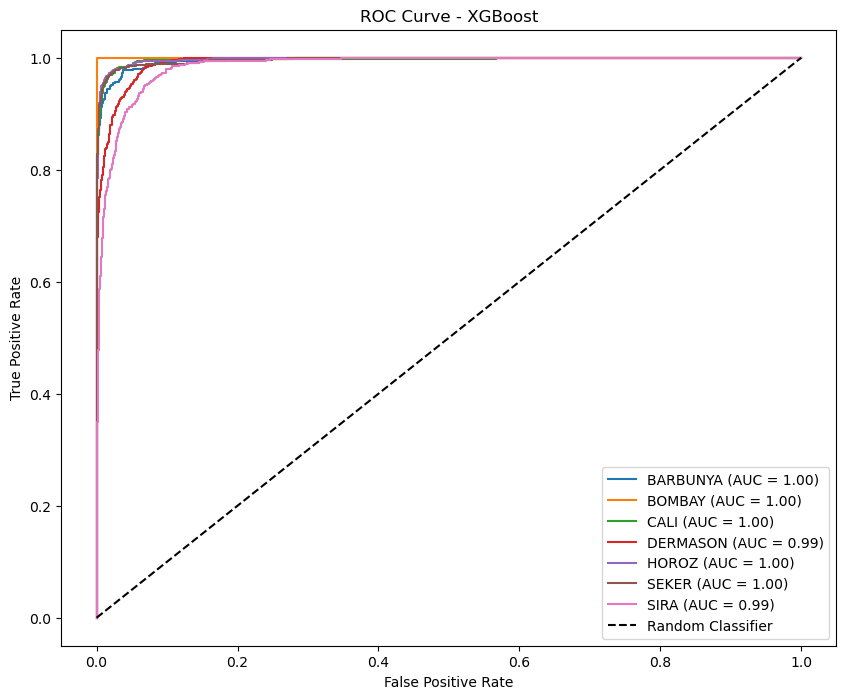

In [424]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

models = [LR, SVM, dt, XGB]
model_names = ['Logistic Regression', 'SVM', 'Decision Tree', 'XGBoost']

# 对多类别标签进行二值化处理
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_bin.shape[1]  

class_names =  encoder.classes_
labels = [f"{cls} ({count})" for cls, count in class_counts.items()]


# 遍历每个模型并绘制 ROC 曲线
for model, name in zip(models, model_names):
    plt.figure(figsize=(10, 8))
    
    # 根据模型类型选择预测方法
    if hasattr(model, 'predict_proba'):
        y_prob = model.predict_proba(X_test) 
    else:
        y_prob = model.decision_function(X_test)  
        
        if y_prob.ndim == 1:
            y_prob = y_prob.reshape(-1, 1)
        if y_prob.shape[1] == 1:
            y_prob = np.hstack([1 - y_prob, y_prob])
    
    if y_prob.shape[1] != n_classes:
        raise ValueError(f"Model {name} output shape mismatch. Expected {n_classes}, got {y_prob.shape[1]}")

    # 为每个类别计算并绘制 ROC 曲线
    for class_idx in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_bin[:, class_idx], y_prob[:, class_idx])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{class_names[class_idx]} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
    plt.title(f'ROC Curve - {name}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.savefig(f'ROC Curve - {name}.png')
    plt.show()

# 5. Open-ended Exploration


## 5.1 Voting

In [425]:
from sklearn.ensemble import VotingClassifier

classifiers = [
                ('LR:', LR),
                ('SVM:', SVM),
                ('KNN:', KNN),
                ('XGB:', XGB),
                ]
    
for clf_name, clf in classifiers:
    y_pred = clf.predict(X_test)
    print(clf_name, accuracy_score(y_test, y_pred))

voting = VotingClassifier(estimators=classifiers)
voting.fit(X_train, y_train)
y_pred_voting = voting.predict(X_test)
print('Voting Classifier: ',accuracy_score(y_test, y_pred_voting))

evaluate_dataset(X_test, y_test, "testing set ", voting,"Voting Classifier",encoder)


LR: 0.9214865862663056
SVM: 0.9246861924686193
KNN: 0.9165641151858233
XGB: 0.9229633275904504
Voting Classifier:  0.9249323160226434

Voting Classifier:testing set evaluation outcome
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.91      0.92       397
      BOMBAY       1.00      1.00      1.00       156
        CALI       0.94      0.94      0.94       489
    DERMASON       0.91      0.93      0.92      1064
       HOROZ       0.95      0.95      0.95       558
       SEKER       0.94      0.95      0.95       608
        SIRA       0.88      0.87      0.87       791

    accuracy                           0.92      4063
   macro avg       0.94      0.94      0.94      4063
weighted avg       0.92      0.92      0.92      4063



0.9249323160226434

# 5.2 feature engineering

### 5.2.1 Generate polynomial features based on original 16 features

In [437]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(
    degree=2,           # 多项式阶数
    interaction_only=False,  # 是否仅保留交互项（False则保留单项式和交互项）
    include_bias=False   # 是否包含偏置项（通常设为False）
)

X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

poly_feature_names = poly.get_feature_names_out(input_features=feature_names)
print(np.shape(X_train_poly),np.shape(X_test_poly))
# print("生成的多项式特征:\n", poly_feature_names)

(9480, 152) (4063, 152)


In [436]:
#Use voting classfier to test new feature
voting.fit(X_train_poly, y_train)

y_pred_train = voting.predict(X_train_poly)
y_pred_test = voting.predict(X_test_poly)

train_accuracy = accuracy_score(y_train, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)

print(f"Train Accuracy: {train_accuracy:.3f}")
print(f"Test Accuracy: {test_accuracy:.3f}")

print('On testing set:')
print(classification_report(y_test, y_pred_test, target_names=encoder.classes_))

Train Accuracy: 0.952
Test Accuracy: 0.925
On testing set:
              precision    recall  f1-score   support

    BARBUNYA       0.94      0.91      0.92       397
      BOMBAY       1.00      1.00      1.00       156
        CALI       0.93      0.94      0.94       489
    DERMASON       0.92      0.92      0.92      1064
       HOROZ       0.95      0.94      0.95       558
       SEKER       0.95      0.95      0.95       608
        SIRA       0.87      0.88      0.88       791

    accuracy                           0.92      4063
   macro avg       0.94      0.93      0.94      4063
weighted avg       0.93      0.92      0.92      4063



Top Features by Gain:
Compactness: 128.7175
ConvexArea: 101.1526
MajorAxisLength ShapeFactor2: 84.2332
Area: 77.1616
ShapeFactor1: 32.6285
MinorAxisLength ShapeFactor1: 21.0192
Perimeter ShapeFactor1: 17.4603
MinorAxisLength: 17.2855
MinorAxisLength Compactness: 16.7527
ShapeFactor1^2: 14.6909


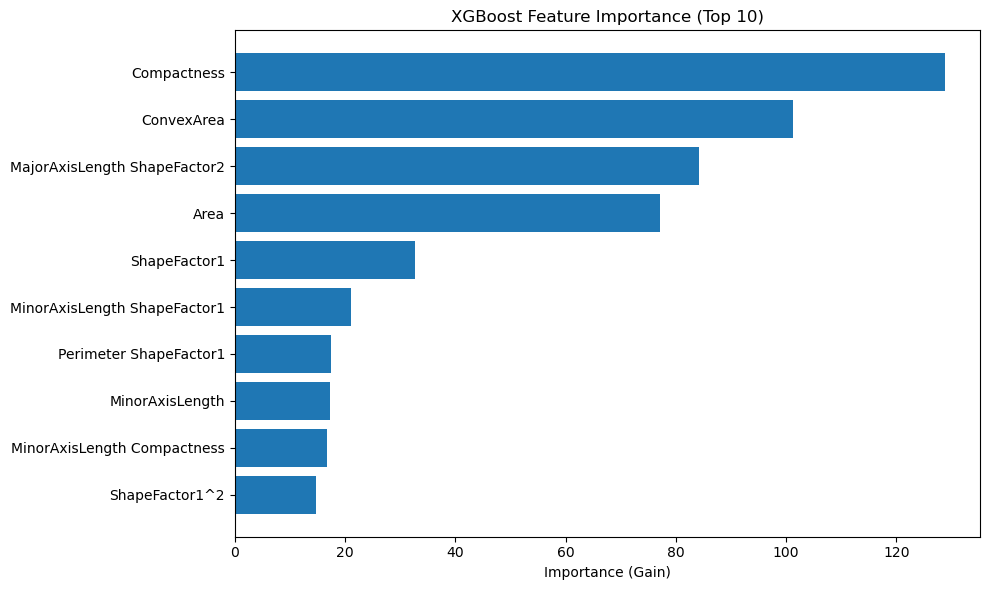

In [444]:
XGB_new = xgb.XGBClassifier(n_estimators=200, learning_rate=0.1)
XGB_new.fit(X_train_poly, y_train)

# 获取基于增益的重要性
importance = XGB_new.get_booster().get_score(importance_type='gain')
sorted_features = sorted(importance.items(), key=lambda x: x[1], reverse=True)
feature_names_mapped = {
    f'f{i}': name for i, name in enumerate(poly_feature_names)
}

top_n = 10
top = sorted_features[:top_n]
feature_names_top = [feature_names_mapped[f] for f, _ in top]  
scores_top = [score for _, score in top]

print("Top Features by Gain:")
for name, score in zip(feature_names_top, scores_top):
    print(f"{name}: {score:.4f}")

plt.figure(figsize=(10, 6))
plt.barh(feature_names_top[::-1], scores_top[::-1])  
plt.xlabel("Importance (Gain)")
plt.title(f"XGBoost Feature Importance (Top {top_n})")
plt.tight_layout()
plt.savefig(f"XGB_Feature_Importance_Top_{top_n}.png", bbox_inches="tight")
plt.show()

### 5.2.2 Does removing some features affect the model classification results？

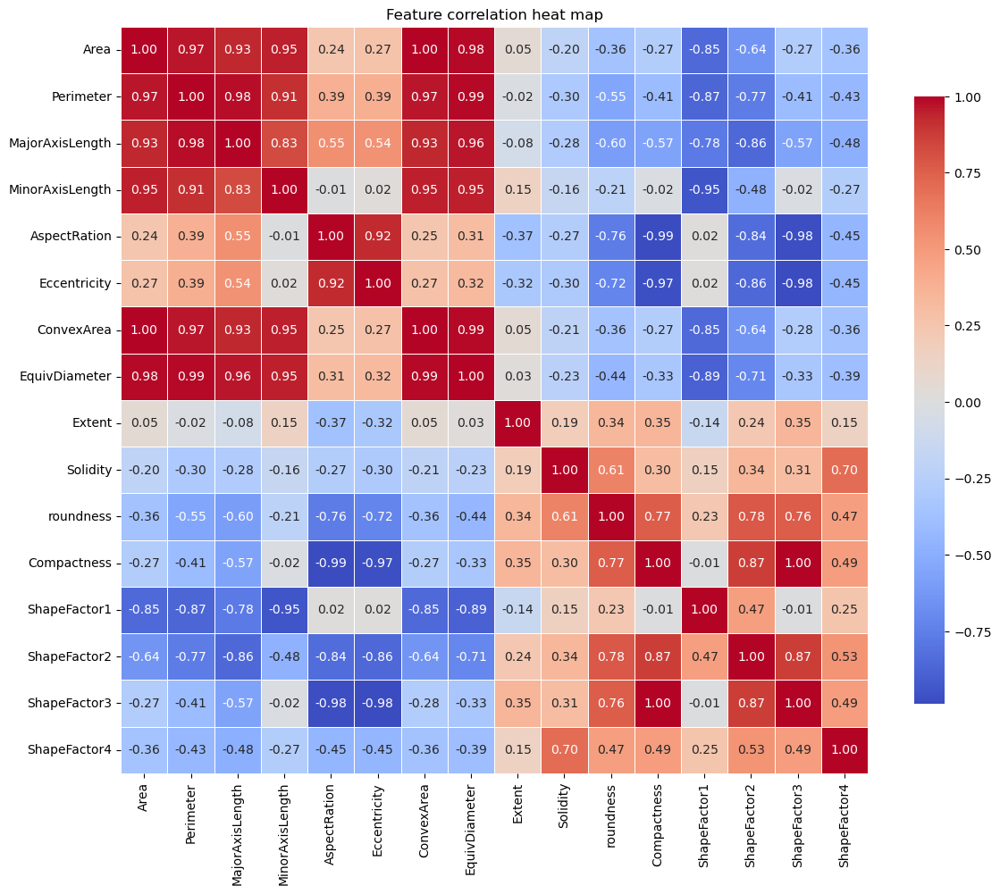

In [493]:
# 计算相关性矩阵
corr_matrix = df[feature_names].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', 
            xticklabels=feature_names, yticklabels=feature_names, 
            square=True, linewidths=0.5, cbar_kws={"shrink": .8})

plt.title('Feature correlation heat map')
plt.tight_layout()
plt.savefig('feature_correlation_heatmap.png', dpi=200, bbox_inches='tight')
plt.show()

In [457]:
#删去一部分，分类结果稳定
corr_matrix = df[feature_names].corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
#相关性绝对值大于0.9的特征只保留一个
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]
print("高度相关、建议删除的特征：", to_drop)
print(f"剩余{16-len(to_drop)}个特征")
df_reduced = df.drop(columns=to_drop)

X_reduced = df_reduced.iloc[:, :-1]  
y_reduced = df_reduced.iloc[:, -1] 

feature_names_reduced=X_reduced.columns

encoder = LabelEncoder()
y_encoded_reduced = encoder.fit_transform(y_reduced)

scaler = StandardScaler()
X_std_reduced = pd.DataFrame(scaler.fit_transform(X_reduced), columns=X_reduced.columns, index=X_reduced.index)

高度相关、建议删除的特征： ['Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Compactness', 'ShapeFactor1', 'ShapeFactor3']
剩余7个特征


In [458]:
X_train_r, X_test_r, y_train, y_test = train_test_split(
    X_std_reduced, y_encoded_reduced, test_size=0.3, random_state=42, stratify=y_encoded_reduced
)
voting = VotingClassifier(estimators=classifiers)
voting.fit(X_train_r, y_train)

y_pred_train = voting.predict(X_train_r)
y_pred_test = voting.predict(X_test_r)

train_accuracy = accuracy_score(y_train, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)

print(f"Train Accuracy: {train_accuracy:.3f}")
print(f"Test Accuracy: {test_accuracy:.3f}")

print(classification_report(y_test, y_pred_test, target_names=encoder.classes_))


Train Accuracy: 0.951
Test Accuracy: 0.922
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.91      0.92       397
      BOMBAY       1.00      1.00      1.00       156
        CALI       0.94      0.94      0.94       489
    DERMASON       0.90      0.92      0.91      1064
       HOROZ       0.96      0.95      0.95       558
       SEKER       0.94      0.94      0.94       608
        SIRA       0.87      0.86      0.87       791

    accuracy                           0.92      4063
   macro avg       0.94      0.93      0.93      4063
weighted avg       0.92      0.92      0.92      4063



## 5.3 区分DERMASON和SIRA二分类

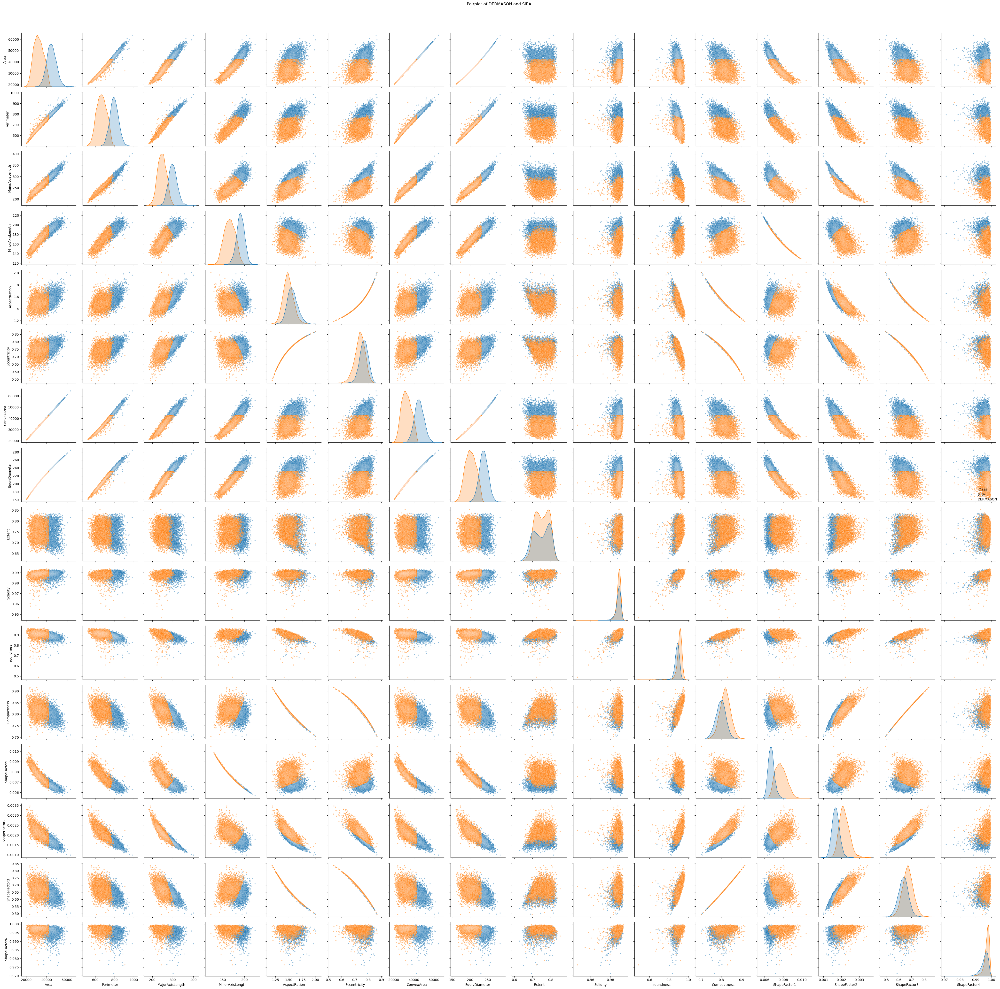

In [503]:
# 只保留DERMASON和SIRA的数据
target_classes = ['DERMASON', 'SIRA']
mask = df['Class'].isin(target_classes)
new_df = df[mask]

# 绘制pairplot
sns.pairplot(new_df, vars=feature_names, hue='Class', plot_kws={'alpha':0.5, 's':10})
plt.suptitle('Pairplot of DERMASON and SIRA', y=1.02)
plt.tight_layout()
plt.savefig('pairplot_DERMASON_SIRA.png', dpi=200, bbox_inches='tight')
plt.show()

In [521]:
target_classes=['DERMASON','SIRA']
mask = np.isin(df.iloc[:, -1], target_classes)
new_df=df[mask]
X_bi = new_df.iloc[:, :-1]
y_bi = new_df.iloc[:, -1]

# X_bi['Perimeter_to_Area'] = df['Perimeter'] * df['Area']  # 周长面积比（可能区分形状）

encoder = LabelEncoder()
y_encoded_bi = encoder.fit_transform(y_bi)
X_std_bi = pd.DataFrame(StandardScaler().fit_transform(X_bi),columns=X_bi.columns,index=X_bi.index)

X_train_bi, X_test_bi, y_train, y_test = train_test_split(
    X_std_bi, y_encoded_bi, test_size=0.3, random_state=42, stratify=y_encoded_bi
)

LR_bi = LogisticRegression(max_iter=1000)
LR_bi.fit(X_train_bi, y_train)

y_pred_train = LR_bi.predict(X_train_bi)
y_pred_test = LR_bi.predict(X_test_bi)
train_accuracy_LR = accuracy_score(y_train, y_pred_train)
test_accuracy_LR = accuracy_score(y_test, y_pred_test)
print(f"Train Accuracy: {train_accuracy_LR:.3f}")
print(f"Test Accuracy: {test_accuracy_LR:.3f}")

Train Accuracy: 0.924
Test Accuracy: 0.913


XGBoost feature importance
Perimeter          0.678137
ConvexArea         0.128387
Area               0.034013
roundness          0.020604
MinorAxisLength    0.018486
ShapeFactor2       0.017051
Compactness        0.015910
ShapeFactor1       0.015869
ShapeFactor4       0.015793
Extent             0.015595
AspectRation       0.014964
Solidity           0.014834
MajorAxisLength    0.010358
Eccentricity       0.000000
EquivDiameter      0.000000
ShapeFactor3       0.000000
dtype: float32


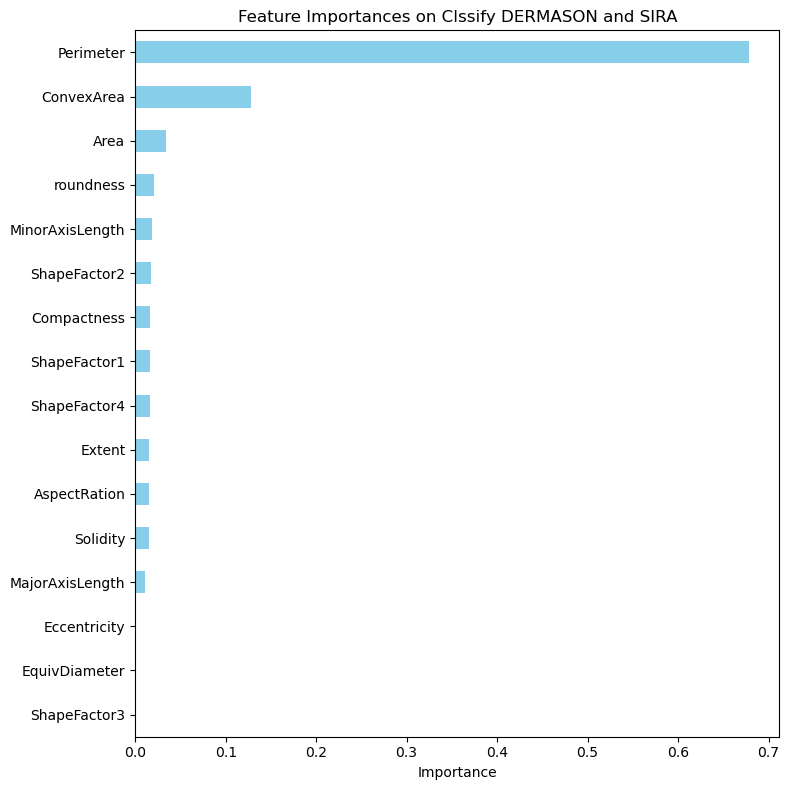

In [522]:
xgb_bi = xgb.XGBClassifier(eval_metric='logloss')
xgb_bi.fit(X_train_bi, y_train)
importances = xgb_bi.feature_importances_
feature_importance_xgb = pd.Series(importances, index=X_train_bi.columns).sort_values(ascending=False)
print("XGBoost feature importance")
print(feature_importance_xgb)

feature_importance_xgb.plot(kind='barh', figsize=(8, 8), color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel('Importance')
plt.title('Feature Importances on Clssify DERMASON and SIRA')
plt.tight_layout()
plt.show()